### 1. Reading MATLAB structure and saving to .csv

In [11]:
import mat73

mat_fname = '/mnt/nikita_disk/Neuroscience/sub_all.mat'

mat_contents = mat73.loadmat(mat_fname)
mat_contents

{'subs_ica': [{'left_im1': {'cfg': {'callinfo': {'calltime': array([2.0210e+03, 2.0000e+00, 1.0000e+00, 1.4000e+01, 3.2000e+01,
             1.0278e+01]),
      'computer': 'pcwin64',
      'fieldtrip': 'unknown',
      'hostname': 'VADIM',
      'matlab': '9.6.0.1072779 (R2019a)',
      'proctime': array(0.9218083),
      'pwd': 'D:\\Novgorod\\sub3',
      'user': 'днс',
      'usercfg': {'checkpath': 'pedantic',
       'component': array([1., 5.]),
       'outputfilepresent': 'overwrite',
       'progress': {'noerase': array(0.)},
       'toolbox': {'cleanup': ['D:\\fieldtrip-20200607\\fieldtrip-20200607\\external\\mne',
         'D:\\fieldtrip-20200607\\fieldtrip-20200607\\external\\eeglab'],
        'images': 'compat',
        'signal': 'compat',
        'stats': 'compat'},
       'trackmeminfo': 'no',
       'tracktimeinfo': 'yes'}},
     'checkpath': 'pedantic',
     'component': [['runica001'], ['runica005']],
     'demean': 'yes',
     'feedback': 'text',
     'outputfilepresen

In [12]:
len(mat_contents['subs_ica'])

15

In [13]:
mat_contents['subs_ica'][0]

{'left_im1': {'cfg': {'callinfo': {'calltime': array([2.0210e+03, 2.0000e+00, 1.0000e+00, 1.4000e+01, 3.2000e+01,
           1.0278e+01]),
    'computer': 'pcwin64',
    'fieldtrip': 'unknown',
    'hostname': 'VADIM',
    'matlab': '9.6.0.1072779 (R2019a)',
    'proctime': array(0.9218083),
    'pwd': 'D:\\Novgorod\\sub3',
    'user': 'днс',
    'usercfg': {'checkpath': 'pedantic',
     'component': array([1., 5.]),
     'outputfilepresent': 'overwrite',
     'progress': {'noerase': array(0.)},
     'toolbox': {'cleanup': ['D:\\fieldtrip-20200607\\fieldtrip-20200607\\external\\mne',
       'D:\\fieldtrip-20200607\\fieldtrip-20200607\\external\\eeglab'],
      'images': 'compat',
      'signal': 'compat',
      'stats': 'compat'},
     'trackmeminfo': 'no',
     'tracktimeinfo': 'yes'}},
   'checkpath': 'pedantic',
   'component': [['runica001'], ['runica005']],
   'demean': 'yes',
   'feedback': 'text',
   'outputfilepresent': 'overwrite',
   'previous': [{'callinfo': {'calltime': arr

In [14]:
type(mat_contents['subs_ica'][0]['left_real']['trial'])

list

In [15]:
# Typical shape of a trial

mat_contents['subs_ica'][0]['left_real']['trial'][0]

array([[-1.03598653e-05, -1.98608647e-05, -2.76844564e-05, ...,
        -7.16295907e-06, -3.02613973e-06,  9.66511756e-07],
       [ 2.68916453e-06,  4.88606881e-06,  6.58706949e-06, ...,
         4.51957497e-06,  2.96748022e-06,  1.59456506e-06],
       [ 4.45149519e-06,  2.49801333e-06,  1.00598444e-06, ...,
        -3.61261757e-06, -1.78406366e-06,  5.01598941e-07],
       ...,
       [ 8.04644869e-06,  5.55589593e-06,  3.50603365e-06, ...,
         9.63876164e-06,  7.11051964e-06,  4.13444299e-06],
       [ 5.76120403e-06,  4.68144777e-06,  3.82736452e-06, ...,
         2.87874469e-06,  1.58525528e-06,  2.01808103e-07],
       [ 1.21524041e-06, -4.03222374e-08, -1.05063302e-06, ...,
        -1.47219359e-06, -1.76756491e-06, -2.03717879e-06]])

In [6]:
# Let's save all files for later reuse

import numpy as np
import pandas as pd

def save_csv(mat_contents: dict ,save_folder: str, label: str):
    cnt_i = 0
    # left hand
    for i in mat_contents['subs_ica']:
        cnt_i += 1
        cnt_j = 0
        for j in i[label]['trial']:
            cnt_j += 1
            df = pd.DataFrame(j.T)
            df.to_csv(save_folder + f'/{label}/{cnt_i}_{cnt_j}.csv')

# save_csv(mat_contents = mat_contents, save_folder='Motoric_NeuroScience_Data', label = 'right_real')


### 2. Analyzing motorical dataset

In [7]:
df_saved = pd.read_csv('Motoric NeuroScience Data/left_real/1_1.csv')
df_saved = df_saved.drop(['Unnamed: 0'], axis=1)
df_saved.describe()

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
count,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,...,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03,9.972000e+03
mean,-5.272190e-21,5.740959e-22,-4.885495e-22,1.641402e-21,-2.322375e-21,-3.022418e-22,-1.255780e-21,5.035310e-22,-6.751121e-22,3.627836e-22,...,-6.385874e-22,-6.813765e-22,-1.212747e-22,2.720240e-22,-4.231767e-22,1.056668e-22,-3.566678e-22,-7.592888e-22,3.642727e-22,-2.833211e-22
std,9.136544e-06,6.749622e-06,5.286881e-06,8.782366e-06,6.866848e-06,7.509857e-06,3.173603e-06,2.997042e-06,5.284168e-06,7.345933e-06,...,4.956510e-06,3.480958e-06,7.183710e-06,7.657762e-06,7.532197e-06,6.655402e-06,5.245966e-06,7.769272e-06,6.354162e-06,6.497066e-06
min,-4.477565e-05,-2.583367e-05,-1.947242e-05,-3.785894e-05,-2.516494e-05,-2.494484e-05,-1.101083e-05,-9.524843e-06,-2.025414e-05,-2.609192e-05,...,-1.922561e-05,-1.183520e-05,-2.487087e-05,-2.705744e-05,-2.734037e-05,-2.101358e-05,-1.684020e-05,-2.830106e-05,-2.463780e-05,-2.513613e-05
25%,-5.803160e-06,-4.452933e-06,-3.250905e-06,-5.608915e-06,-4.740772e-06,-4.855862e-06,-2.228286e-06,-2.097966e-06,-3.587642e-06,-4.778554e-06,...,-3.334000e-06,-2.312010e-06,-4.691084e-06,-4.932317e-06,-5.033716e-06,-4.433171e-06,-3.586168e-06,-5.278353e-06,-4.443801e-06,-4.473604e-06
50%,2.744881e-07,-8.068661e-08,1.029275e-07,1.528440e-08,-1.416156e-08,3.897871e-08,-1.313871e-07,-2.097806e-08,-1.579780e-07,-1.578897e-08,...,-1.325961e-07,-5.899401e-09,-2.014584e-07,1.550812e-07,3.206238e-07,2.704520e-08,-1.328668e-07,5.949596e-08,3.926294e-08,-9.036624e-09
75%,6.053323e-06,4.547327e-06,3.490397e-06,5.630451e-06,4.528553e-06,5.003374e-06,2.085852e-06,1.994487e-06,3.282194e-06,4.741163e-06,...,3.218314e-06,2.308156e-06,4.464535e-06,4.996883e-06,4.904917e-06,4.411509e-06,3.493349e-06,4.881771e-06,4.402948e-06,4.508087e-06
max,2.556547e-05,2.245614e-05,1.762593e-05,3.065744e-05,2.320391e-05,2.333236e-05,1.372702e-05,1.040920e-05,2.095233e-05,2.927610e-05,...,1.786628e-05,1.413201e-05,3.122835e-05,2.907916e-05,2.931666e-05,2.530940e-05,2.182159e-05,3.282882e-05,2.233037e-05,2.251203e-05


In [16]:
df_saved

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,-1.035987e-05,0.000003,4.451495e-06,0.000012,3.950412e-06,4.210437e-06,1.935546e-06,9.582567e-07,5.565835e-06,5.803684e-06,...,3.373209e-06,1.245894e-06,6.564835e-06,0.000008,0.000008,0.000007,2.819854e-06,0.000008,5.761204e-06,1.215240e-06
1,-1.986086e-05,0.000005,2.498013e-06,0.000010,2.040098e-06,2.798343e-06,1.100413e-06,1.940509e-07,4.032059e-06,3.650995e-06,...,2.703430e-06,3.906553e-07,4.626442e-06,0.000007,0.000008,0.000007,1.601766e-06,0.000006,4.681448e-06,-4.032224e-08
2,-2.768446e-05,0.000007,1.005984e-06,0.000009,1.677068e-07,1.627789e-06,3.829497e-07,-4.057228e-07,2.744966e-06,1.655570e-06,...,2.041446e-06,-4.390722e-07,2.953917e-06,0.000006,0.000008,0.000006,4.874372e-07,0.000004,3.827365e-06,-1.050633e-06
3,-3.259490e-05,0.000007,3.101018e-07,0.000008,-1.617700e-06,8.590276e-07,-1.318354e-07,-7.301348e-07,1.878621e-06,-5.128837e-08,...,1.404909e-06,-1.206998e-06,1.720832e-06,0.000005,0.000007,0.000006,-4.248728e-07,0.000002,3.332631e-06,-1.638848e-06
4,-3.411207e-05,0.000007,5.207596e-07,0.000007,-3.254693e-06,5.190190e-07,-4.136657e-07,-7.518255e-07,1.479663e-06,-1.393225e-06,...,8.197982e-07,-1.867037e-06,9.583687e-07,0.000004,0.000007,0.000005,-1.061344e-06,0.000002,3.189836e-06,-1.747100e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9967,-1.572948e-05,0.000008,-4.595957e-06,-0.000009,1.401384e-06,-2.140744e-06,-7.724105e-07,2.061221e-06,-7.201468e-07,-7.539868e-06,...,-1.342636e-06,-7.497225e-08,8.287619e-06,-0.000001,-0.000001,-0.000005,-3.196414e-07,0.000012,4.608566e-06,-8.844950e-07
9968,-1.145611e-05,0.000006,-4.616835e-06,-0.000009,6.243839e-07,-2.459143e-06,-6.730680e-07,2.152772e-06,-7.330398e-07,-7.439130e-06,...,-1.513430e-06,-2.738234e-07,8.289129e-06,-0.000001,-0.000002,-0.000005,-4.525189e-07,0.000011,3.945474e-06,-1.160539e-06
9969,-7.162959e-06,0.000005,-3.612618e-06,-0.000008,-6.218151e-07,-2.209789e-06,-5.575302e-07,2.095545e-06,-1.379576e-06,-7.260060e-06,...,-1.855795e-06,-6.320867e-07,7.043064e-06,-0.000002,-0.000003,-0.000005,-9.685139e-07,0.000010,2.878745e-06,-1.472194e-06
9970,-3.026140e-06,0.000003,-1.784064e-06,-0.000007,-2.243393e-06,-1.500208e-06,-4.339943e-07,1.897911e-06,-2.541646e-06,-7.016247e-06,...,-2.307339e-06,-1.116531e-06,4.743842e-06,-0.000003,-0.000003,-0.000005,-1.783922e-06,0.000007,1.585255e-06,-1.767565e-06


In [8]:
df_saved.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9972 entries, 0 to 9971
Data columns (total 32 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       9972 non-null   float64
 1   1       9972 non-null   float64
 2   2       9972 non-null   float64
 3   3       9972 non-null   float64
 4   4       9972 non-null   float64
 5   5       9972 non-null   float64
 6   6       9972 non-null   float64
 7   7       9972 non-null   float64
 8   8       9972 non-null   float64
 9   9       9972 non-null   float64
 10  10      9972 non-null   float64
 11  11      9972 non-null   float64
 12  12      9972 non-null   float64
 13  13      9972 non-null   float64
 14  14      9972 non-null   float64
 15  15      9972 non-null   float64
 16  16      9972 non-null   float64
 17  17      9972 non-null   float64
 18  18      9972 non-null   float64
 19  19      9972 non-null   float64
 20  20      9972 non-null   float64
 21  21      9972 non-null   float64
 22  

**Exploratory Data Analysis** of original (Not fixed) dataset.

In [9]:
import os

rootdir = "Motoric NeuroScience Data"
classes_tuple = ("left_real", "right_real")
patients_tuple = tuple(range(1, 16))

def form_data_tree(rootdir: str, classes_data: dict):
    for dirs, subdirs, files in os.walk(rootdir):
        key = dirs.split('/')[-1]
        if key in classes_tuple:
            patients_dict = {}
            for i in patients_tuple:
                patients_dict[i] = []
            classes_data[key] = patients_dict
            for file in files:
                patient_number = int(file.split('_')[0])
                data_link = os.path.join(dirs, file)
                classes_data[key][patient_number].append(data_link)
    return classes_data

def calc_len(folder_tree):
    length_list = []
    for i in folder_tree.values():
            for j in i.values():
                for path in j:
                    dataframe = pd.read_csv(path)
                    dataframe = dataframe.drop(['Unnamed: 0'], axis=1)
                    length_list.append(dataframe.shape[0])
    return length_list

def analyze_mean(classes_data:dict):
    mean_value_dict = {key:[] for key in range(0,32)}
    for i in classes_data.values():
        for j in i.values():
            for path in j:
                dataframe = pd.read_csv(path)
                dataframe = dataframe.drop(['Unnamed: 0'], axis=1)
                for k in range(0,32):
                    mean_value_dict[k].append(dataframe[str(k)].mean())
    return mean_value_dict

In [10]:
classes_data = {} 
classes_data = form_data_tree(rootdir=rootdir, classes_data=classes_data)
classes_data

# dict of labels

classes = {"left_real": 0, "right_real": 1}


In [18]:
left = '/mnt/nikita_disk/Neuroscience/Motoric NeuroScience Data/left_real/1_1.csv'
right = '/mnt/nikita_disk/Neuroscience/Motoric NeuroScience Data/right_real/1_1.csv'



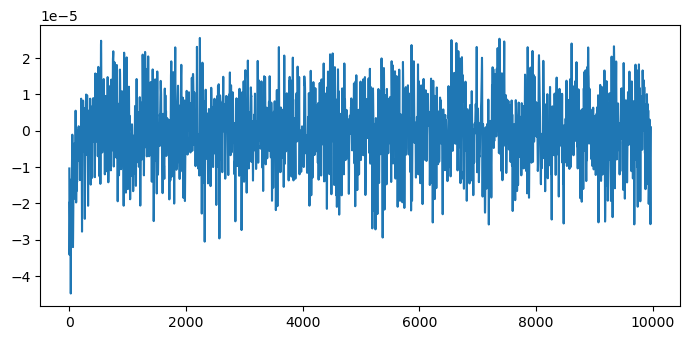

In [21]:
from matplotlib import pyplot as plt

plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True

df_left = pd.read_csv(left)

ind = 'Unnamed: 0'

numbers = range(0,32)

plt.plot(df_left['Unnamed: 0'], df_left['6'])
plt.show()


In [20]:
df_right = pd.read_csv(right)


In [91]:
length_list = calc_len(classes_data)

print(f'Mean trial length in Original Dataset - {np.mean(length_list)}')

Mean trial length in Original Dataset - 9973.467486818981


In [92]:
mean_value_dict = analyze_mean(classes_data = classes_data)

mean_value_df = pd.DataFrame.from_dict(mean_value_dict)
mean_value_df.shape


(569, 32)

In [93]:
mean_value_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       569 non-null    float64
 1   1       569 non-null    float64
 2   2       569 non-null    float64
 3   3       569 non-null    float64
 4   4       569 non-null    float64
 5   5       569 non-null    float64
 6   6       569 non-null    float64
 7   7       569 non-null    float64
 8   8       569 non-null    float64
 9   9       569 non-null    float64
 10  10      569 non-null    float64
 11  11      569 non-null    float64
 12  12      569 non-null    float64
 13  13      569 non-null    float64
 14  14      569 non-null    float64
 15  15      569 non-null    float64
 16  16      569 non-null    float64
 17  17      569 non-null    float64
 18  18      569 non-null    float64
 19  19      569 non-null    float64
 20  20      569 non-null    float64
 21  21      569 non-null    float64
 22  22

In [94]:
mean_value_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
count,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,...,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02
mean,1.763319e-22,1.214293e-22,1.489935e-22,-1.587255e-22,1.034847e-22,6.441452e-23,1.511313e-22,2.034307e-22,-5.602165e-22,-3.702366e-23,...,-1.256240e-23,1.251044e-22,5.585964e-23,2.936535e-23,-1.663923e-23,-3.395125e-24,3.228495e-22,-1.716757e-22,4.229941e-23,-3.012327e-23
std,2.867382e-21,2.349700e-21,2.619413e-21,2.214001e-21,1.279454e-21,1.239493e-21,2.230556e-21,1.290875e-20,6.297475e-21,1.193946e-21,...,9.078299e-22,1.313452e-20,1.561863e-21,5.952816e-22,6.329356e-22,5.978748e-22,3.506969e-21,1.834560e-21,5.107444e-22,3.193076e-21
min,-1.256105e-20,-1.746759e-20,-4.764135e-21,-3.403433e-20,-3.881115e-21,-4.456021e-21,-6.567013e-21,-2.666167e-19,-1.055618e-19,-1.788065e-20,...,-1.262847e-20,-1.881847e-19,-3.432990e-21,-2.093199e-21,-2.754428e-21,-1.919338e-21,-2.119366e-21,-1.851973e-20,-1.879381e-21,-3.623973e-20
25%,-9.125191e-22,-9.115882e-22,-5.977579e-22,-5.613207e-22,-5.172608e-22,-5.614628e-22,-5.329454e-22,-3.655924e-22,-5.329206e-22,-4.908506e-22,...,-2.677120e-22,-1.947989e-22,-2.922663e-22,-3.301374e-22,-3.654534e-22,-3.472351e-22,-2.968819e-22,-3.871082e-22,-2.393161e-22,-2.845103e-22
50%,7.450596e-23,4.055532e-24,2.462058e-23,-2.178958e-23,5.913715e-23,1.745383e-23,4.671762e-25,5.946475e-25,-4.106492e-23,-6.307511e-24,...,2.917002e-23,1.555017e-23,-1.274628e-23,1.553644e-23,-1.791719e-23,-3.960242e-23,-1.105629e-23,-4.262762e-23,8.876380e-24,1.069615e-23
75%,9.788106e-22,8.590096e-22,6.197289e-22,5.390287e-22,6.151325e-22,5.678016e-22,6.464478e-22,3.458683e-22,3.899489e-22,4.419173e-22,...,3.453360e-22,2.531246e-22,2.954045e-22,3.719308e-22,3.409879e-22,3.168330e-22,2.663754e-22,2.714049e-22,3.169896e-22,2.951666e-22
max,3.126374e-20,1.098612e-20,4.408620e-20,5.082899e-21,1.353201e-20,6.513892e-21,4.429398e-20,8.712732e-20,6.930146e-21,9.952053e-21,...,3.201489e-21,1.624970e-19,3.446135e-20,2.725591e-21,2.487506e-21,2.773324e-21,6.139944e-20,9.951003e-21,4.194963e-21,4.475523e-20


In [95]:
# Description of MEAN value df
mean_value_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
count,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,...,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02
mean,1.763319e-22,1.214293e-22,1.489935e-22,-1.587255e-22,1.034847e-22,6.441452e-23,1.511313e-22,2.034307e-22,-5.602165e-22,-3.702366e-23,...,-1.256240e-23,1.251044e-22,5.585964e-23,2.936535e-23,-1.663923e-23,-3.395125e-24,3.228495e-22,-1.716757e-22,4.229941e-23,-3.012327e-23
std,2.867382e-21,2.349700e-21,2.619413e-21,2.214001e-21,1.279454e-21,1.239493e-21,2.230556e-21,1.290875e-20,6.297475e-21,1.193946e-21,...,9.078299e-22,1.313452e-20,1.561863e-21,5.952816e-22,6.329356e-22,5.978748e-22,3.506969e-21,1.834560e-21,5.107444e-22,3.193076e-21
min,-1.256105e-20,-1.746759e-20,-4.764135e-21,-3.403433e-20,-3.881115e-21,-4.456021e-21,-6.567013e-21,-2.666167e-19,-1.055618e-19,-1.788065e-20,...,-1.262847e-20,-1.881847e-19,-3.432990e-21,-2.093199e-21,-2.754428e-21,-1.919338e-21,-2.119366e-21,-1.851973e-20,-1.879381e-21,-3.623973e-20
25%,-9.125191e-22,-9.115882e-22,-5.977579e-22,-5.613207e-22,-5.172608e-22,-5.614628e-22,-5.329454e-22,-3.655924e-22,-5.329206e-22,-4.908506e-22,...,-2.677120e-22,-1.947989e-22,-2.922663e-22,-3.301374e-22,-3.654534e-22,-3.472351e-22,-2.968819e-22,-3.871082e-22,-2.393161e-22,-2.845103e-22
50%,7.450596e-23,4.055532e-24,2.462058e-23,-2.178958e-23,5.913715e-23,1.745383e-23,4.671762e-25,5.946475e-25,-4.106492e-23,-6.307511e-24,...,2.917002e-23,1.555017e-23,-1.274628e-23,1.553644e-23,-1.791719e-23,-3.960242e-23,-1.105629e-23,-4.262762e-23,8.876380e-24,1.069615e-23
75%,9.788106e-22,8.590096e-22,6.197289e-22,5.390287e-22,6.151325e-22,5.678016e-22,6.464478e-22,3.458683e-22,3.899489e-22,4.419173e-22,...,3.453360e-22,2.531246e-22,2.954045e-22,3.719308e-22,3.409879e-22,3.168330e-22,2.663754e-22,2.714049e-22,3.169896e-22,2.951666e-22
max,3.126374e-20,1.098612e-20,4.408620e-20,5.082899e-21,1.353201e-20,6.513892e-21,4.429398e-20,8.712732e-20,6.930146e-21,9.952053e-21,...,3.201489e-21,1.624970e-19,3.446135e-20,2.725591e-21,2.487506e-21,2.773324e-21,6.139944e-20,9.951003e-21,4.194963e-21,4.475523e-20


In [96]:
# Analyzing № of Patients

# for k,v in classes_data.items():
#     for patient_number, data_list in v.items():
#         print(f'Trials for patient number {patient_number} in {k}: {len(data_list)} \n')


### 3. Providing patient distribution

In [97]:
from math import ceil

files_in_a_tree = 569

def divide_to_folds(folder_tree, files_in_a_tree):

    number_of_folds = 4
    elements_per_list = files_in_a_tree/(15*2)
    part = ceil(elements_per_list/number_of_folds)

    fold_1, fold_2, fold_3, fold_4 = [], [], [], []

    # Classes_data - original Dataset:
    # It consists of 8*20 list of len = 25

    for i in folder_tree.values():
        for k,j in i.items():
            for filename in j[:part]:
                fold_1.append(filename)
            for filename in j[part: 2 * part]:
                fold_2.append(filename)
            for filename in j[2 * part: 3 * part]:
                fold_3.append(filename)
            for filename in j[3 * part: ]:
                fold_4.append(filename)

    return (fold_1, fold_2, fold_3, fold_4)


In [98]:
folds_slice = divide_to_folds(classes_data, files_in_a_tree)

for i in folds_slice:
    print(len(i))



150
150
150
119


Let's check, is our distribution OF PATIENTS even or not IN EVERY ITERATION of CUSTOM CV?

In [99]:
class CV_iteration():
    def __init__(self, name: str, train_set: list, valid_set: list, test_set: list):
        self.name = name
        self.train_set = train_set
        self.valid_set = valid_set
        self.test_set = test_set


In [100]:
iteration_original = CV_iteration('original', train_set=folds_slice[0]+folds_slice[1] +
                                  folds_slice[2], valid_set=folds_slice[3], test_set=folds_slice[3][len(folds_slice[3])//2:])

In [101]:
def evaluate_iteration(iteration: CV_iteration):
    def check_distribution(part_of_dataset):
        patients_dict = {}
        for i in patients_tuple:
            patients_dict[i] = 0

        for i in patients_dict:
            for j in part_of_dataset:
                if int(j.split('/')[-1].split('_')[0]) == i:               # Getting the patient №
                    patients_dict[i] = patients_dict[i] + 1
        return patients_dict
    print(f'''Distribution of patients among train set of {iteration.name} is \n {check_distribution(iteration.train_set)} \n
              Distribution of patients among valid set of {iteration.name} is \n {check_distribution(iteration.valid_set)} \n
              Distribution of patients among test set of {iteration.name} is \n {check_distribution(iteration.test_set)} \n ''')


In [102]:
evaluate_iteration(iteration_original)

Distribution of patients among train set of original is 
 {1: 30, 2: 30, 3: 30, 4: 30, 5: 30, 6: 30, 7: 30, 8: 30, 9: 30, 10: 30, 11: 30, 12: 30, 13: 30, 14: 30, 15: 30} 

              Distribution of patients among valid set of original is 
 {1: 10, 2: 8, 3: 8, 4: 10, 5: 10, 6: 9, 7: 6, 8: 8, 9: 8, 10: 2, 11: 9, 12: 8, 13: 9, 14: 7, 15: 7} 

              Distribution of patients among test set of original is 
 {1: 5, 2: 3, 3: 4, 4: 5, 5: 5, 6: 4, 7: 2, 8: 3, 9: 5, 10: 2, 11: 5, 12: 3, 13: 5, 14: 3, 15: 6} 
 


### 4. Creating dataloader

In [1]:
import torch
from torch.utils.data import Dataset, DataLoader

print("PyTorch Version: ", torch.__version__)

PyTorch Version:  1.12.1+cu113


/home/cv-worker/.local/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [104]:
torch.set_default_dtype(torch.float64)

In [105]:
# Function for unifiing the length of the dataloader

def finding_max_len(filenames: dict):
    max_len = 0
    for i in filenames.values():
        for j in i.values():
            for path in j:
                df = pd.read_csv(path)
                df_len = df.shape[0]
                if df_len > max_len:
                    max_len = df_len
    return max_len

MAX_LEN = finding_max_len(classes_data)


In [106]:
print(MAX_LEN)

10095


In [107]:
# function for making zero lists of n length

def zerolistmaker(n):
    listofzeros = [0] * n
    return listofzeros

# main preprocessing function

def fix_df(df: pd.DataFrame, zero_list_function, MAX_LEN: int):
    df = df.drop(['Unnamed: 0'], axis=1)
    # Преобразование заголовков из str в int ДЛЯ ИЗБЕЖАНИЯ ОШИБОК
    df.columns = list(range(32))
    # ADD EXTRA ROWS HERE
    foundation = [zero_list_function(32) for i in range(MAX_LEN - len(df))]
    foundation = pd.DataFrame(foundation)
    df = pd.concat([df, foundation], ignore_index=True, axis=0)

    return df


In [108]:
df_saved = pd.read_csv('Motoric NeuroScience Data/left_real/1_1.csv')
df_saved = fix_df(df_saved, zerolistmaker, MAX_LEN)
df_saved.describe()


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
count,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,...,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04,1.009500e+04
mean,-5.207952e-21,5.671009e-22,-4.825969e-22,1.621403e-21,-2.294079e-21,-2.985592e-22,-1.240480e-21,4.973959e-22,-6.668864e-22,3.583633e-22,...,-6.308067e-22,-6.730744e-22,-1.197971e-22,2.687096e-22,-4.180206e-22,1.043793e-22,-3.523221e-22,-7.500374e-22,3.598343e-22,-2.798691e-22
std,9.080707e-06,6.708373e-06,5.254570e-06,8.728693e-06,6.824882e-06,7.463961e-06,3.154208e-06,2.978726e-06,5.251874e-06,7.301039e-06,...,4.926218e-06,3.459684e-06,7.139808e-06,7.610962e-06,7.486165e-06,6.614728e-06,5.213906e-06,7.721791e-06,6.315329e-06,6.457360e-06
min,-4.477565e-05,-2.583367e-05,-1.947242e-05,-3.785894e-05,-2.516494e-05,-2.494484e-05,-1.101083e-05,-9.524843e-06,-2.025414e-05,-2.609192e-05,...,-1.922561e-05,-1.183520e-05,-2.487087e-05,-2.705744e-05,-2.734037e-05,-2.101358e-05,-1.684020e-05,-2.830106e-05,-2.463780e-05,-2.513613e-05
25%,-5.702597e-06,-4.377919e-06,-3.213820e-06,-5.531260e-06,-4.672588e-06,-4.748066e-06,-2.195993e-06,-2.056411e-06,-3.542140e-06,-4.710711e-06,...,-3.294255e-06,-2.287517e-06,-4.626411e-06,-4.827193e-06,-4.961354e-06,-4.376924e-06,-3.522713e-06,-5.208821e-06,-4.363685e-06,-4.404052e-06
50%,1.358791e-07,0.000000e+00,3.764128e-08,0.000000e+00,0.000000e+00,0.000000e+00,-8.548045e-08,0.000000e+00,-8.508814e-08,0.000000e+00,...,-6.101913e-08,0.000000e+00,-1.039583e-07,4.606503e-08,2.066799e-07,0.000000e+00,-5.612503e-08,0.000000e+00,0.000000e+00,0.000000e+00
75%,5.970076e-06,4.498056e-06,3.445088e-06,5.566683e-06,4.470577e-06,4.930400e-06,2.044403e-06,1.966917e-06,3.217369e-06,4.673118e-06,...,3.171350e-06,2.278407e-06,4.386129e-06,4.905511e-06,4.841260e-06,4.367647e-06,3.451355e-06,4.803658e-06,4.349117e-06,4.459258e-06
max,2.556547e-05,2.245614e-05,1.762593e-05,3.065744e-05,2.320391e-05,2.333236e-05,1.372702e-05,1.040920e-05,2.095233e-05,2.927610e-05,...,1.786628e-05,1.413201e-05,3.122835e-05,2.907916e-05,2.931666e-05,2.530940e-05,2.182159e-05,3.282882e-05,2.233037e-05,2.251203e-05


In [109]:
df_saved

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,-0.000010,0.000003,4.451495e-06,0.000012,3.950412e-06,4.210437e-06,1.935546e-06,9.582567e-07,0.000006,5.803684e-06,...,3.373209e-06,1.245894e-06,6.564835e-06,0.000008,0.000008,0.000007,2.819854e-06,0.000008,0.000006,1.215240e-06
1,-0.000020,0.000005,2.498013e-06,0.000010,2.040098e-06,2.798343e-06,1.100413e-06,1.940509e-07,0.000004,3.650995e-06,...,2.703430e-06,3.906553e-07,4.626442e-06,0.000007,0.000008,0.000007,1.601766e-06,0.000006,0.000005,-4.032224e-08
2,-0.000028,0.000007,1.005984e-06,0.000009,1.677068e-07,1.627789e-06,3.829497e-07,-4.057228e-07,0.000003,1.655570e-06,...,2.041446e-06,-4.390722e-07,2.953917e-06,0.000006,0.000008,0.000006,4.874372e-07,0.000004,0.000004,-1.050633e-06
3,-0.000033,0.000007,3.101018e-07,0.000008,-1.617700e-06,8.590276e-07,-1.318354e-07,-7.301348e-07,0.000002,-5.128837e-08,...,1.404909e-06,-1.206998e-06,1.720832e-06,0.000005,0.000007,0.000006,-4.248728e-07,0.000002,0.000003,-1.638848e-06
4,-0.000034,0.000007,5.207596e-07,0.000007,-3.254693e-06,5.190190e-07,-4.136657e-07,-7.518255e-07,0.000001,-1.393225e-06,...,8.197982e-07,-1.867037e-06,9.583687e-07,0.000004,0.000007,0.000005,-1.061344e-06,0.000002,0.000003,-1.747100e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00
10091,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00
10092,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00
10093,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00


In [110]:
class CustomDataset(Dataset):
    def __init__(self, filenames: list, classes: dict):
        self.filenames = filenames
        self.classes = classes

    def __len__(self):
        return int(len(self.filenames))

    def __getitem__(self, idx):

        data = pd.read_csv(self.filenames[idx])
        data = fix_df(data, zerolistmaker, MAX_LEN)

        # data = torch.from_numpy(np.asarray(data))

        data = torch.from_numpy(np.moveaxis(np.asarray(data), 0, 1))

        splitted_name = self.filenames[idx].split('/')
        class_label = splitted_name[1]

        label = self.classes[class_label]
        if idx == self.__len__():
            raise IndexError

        return data, label


In [111]:
check_dataset = CustomDataset(filenames=iteration_original.train_set, classes=classes)
for i, (data, label) in enumerate(check_dataset):
    print(f"Our dataset returns {data.dtype} and it's example is {data.shape}")
    print(f"Our label is {label} and it's type is {type(label)}")
    if i == 0: break

Our dataset returns torch.float64 and it's example is torch.Size([32, 10095])
Our label is 1 and it's type is <class 'int'>


In [112]:
dataloader = DataLoader(check_dataset, batch_size=1, shuffle=True)

for i, (data, label) in enumerate(dataloader):
    print(
        f"Our DataLoader returns {data.dtype} and it's example is {data.shape}")
    print(f'Our DataLoader looks like {data}')
    print(f"Our label is {label} and it's type is {label.dtype}")
    if i == 0:
        break

Our DataLoader returns torch.float64 and it's example is torch.Size([1, 32, 10095])
Our DataLoader looks like tensor([[[-2.6821e-06, -1.2826e-06, -2.1183e-07,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [-3.7600e-07, -9.8722e-07, -1.6843e-06,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [-3.0374e-06, -2.2672e-06, -1.6775e-06,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         ...,
         [ 4.9348e-07,  5.4303e-07,  5.8194e-07,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [-4.1987e-07, -3.2038e-07, -2.1913e-07,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [-9.7721e-07, -8.0409e-07, -6.8758e-07,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00]]])
Our label is tensor([1]) and it's type is torch.int64


### 5. ChronoNet pipeline

In [113]:
from torch import nn
from torch.nn import functional as F
from torchmetrics.classification import F1Score


class CNBlock(nn.Module):
    def __init__(self, in_channels: int):
        super(CNBlock, self).__init__()

        self.in_channels = in_channels
        # self.out_channels = out_channels
        # self.kernel_size = kernel_size
        # self.stride = stride
        # self.padding = padding

        self.conv1 = nn.Conv1d(in_channels= self.in_channels, out_channels= 32,kernel_size= 2, stride= 2,padding= 0)
        self.conv2 = nn.Conv1d(in_channels= self.in_channels, out_channels= 32,kernel_size= 4, stride= 2,padding= 1)
        self.conv3 = nn.Conv1d(in_channels= self.in_channels, out_channels= 32,kernel_size= 8, stride= 2,padding= 3)
        self.relu = nn.ReLU()

    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(x)
        x3 = self.conv3(x)
        x = torch.cat([x1,x2,x3], dim=1)
        return x

class ChronoNet(nn.Module):
    def __init__(self, first_gru_length, out_dim = 8):
        super().__init__()

        # self.in_channels = in_channels
        # self.out_channels = out_channels
        # self.kernel_size = kernel_size
        # self.stride = stride
        # self.padding = padding

        self.block1 = CNBlock(32)
        self.block2 = CNBlock(96)
        self.block3 = CNBlock(96)

        self.gru1 = nn.GRU(input_size= 96, hidden_size=32, batch_first = True)
        self.gru2 = nn.GRU(input_size= 32, hidden_size=32, batch_first = True)
        self.gru3 = nn.GRU(input_size= 64, hidden_size=32, batch_first = True)
        self.gru4 = nn.GRU(input_size= 96, hidden_size=32, batch_first = True)
        self.gru_linear = nn.Linear(first_gru_length,1)
        self.flatten = nn.Flatten()
        self.fcl = nn.Linear(32,out_dim)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = x.permute(0,2,1)

        gru_out1,_ = self.gru1(x)
        gru_out2,_ = self.gru2(gru_out1)
        gru_out = torch.cat([gru_out1,gru_out2], dim=2)
        gru_out3,_ =self.gru3(gru_out)
        gru_out = torch.cat([gru_out1,gru_out2,gru_out3],dim=2)
        
        linear_out=self.relu(self.gru_linear(gru_out.permute(0,2,1)))
        gru_out4,_=self.gru4(linear_out.permute(0,2,1))
        x=self.flatten(gru_out4)
        x = self.fcl(x)
        return x


In [114]:
# Original data
train_dl_original = DataLoader(CustomDataset(
    filenames=iteration_original.train_set, classes=classes), batch_size=10, shuffle=True)
val_dl_original = DataLoader(CustomDataset(
    filenames=iteration_original.valid_set, classes=classes), batch_size=10, shuffle=True)

for i, (data, label) in enumerate(train_dl_original):
    print(
        f"Our DataLoader returns {type(data)} and it's example is {data.shape}")
    seq_length = data.shape[2]
    print(f'Seq_lenght is {seq_length}')
    print(f'Type of data is {data[1,:,-1][-1].dtype}')
    print(f"Our label is {label[-1]} and it's type is {label[-1].dtype}")
    if i == 0:
        break

Our DataLoader returns <class 'torch.Tensor'> and it's example is torch.Size([10, 32, 10095])
Seq_lenght is 10095
Type of data is torch.float64
Our label is 1 and it's type is torch.int64


In [115]:
first_gru_length = seq_length // 8
output_dim = 2

lr = 0.05
n_epochs = 50
best_f1 = 0
patience, trials = 15, 0

In [116]:
model = ChronoNet(first_gru_length=first_gru_length, out_dim=output_dim)
model = model.cuda()
# nn.CrossEntropyLoss is a loss function, that applies Softmax automatically
criterion = nn.CrossEntropyLoss()
opt = torch.optim.RMSprop(model.parameters(), lr=lr)

In [117]:
inp = torch.randn(20, 32, seq_length)
inp = inp.cuda()


out = model(inp)
print(out.shape)

torch.Size([20, 2])


In [118]:
from torchinfo import summary

# This should help with VISUALIZING MODEL ARCHITECTURE

dev = torch.device(
    "cuda") if torch.cuda.is_available() else torch.device("cpu")

# summary(ChronoNet(first_gru_length=first_gru_length, out_dim=output_dim),
#         input_size=(10, 32, seq_length), col_names=["kernel_size", "input_size", "output_size", "num_params"], 
#         verbose=2)


### 7. ChronoNet Model training

In [119]:
from torch.utils.tensorboard import SummaryWriter

log_folder = 'runs/Chrononet_motoric_1'
writer = SummaryWriter(log_folder)
writer.add_text('TEXT', 'Start model training', 0)

In [120]:
print('Start model training')

for epoch in range(1, n_epochs + 1):

    for i, (x_batch, y_batch) in enumerate(train_dl_original):
        model.train()
        x_batch = x_batch.cuda()
        # print(f'Model input is {x_batch}')
        y_batch = y_batch.cuda()
        opt.zero_grad()
        # SOFTMAX is not needed, because
        # OUR LOSS Function applies it for us
        out = model(x_batch)

        # print(f'model output is {out}')
        # print(f'Real labels are {y_batch}')

        loss = criterion(out, y_batch)
        writer.add_scalar("Loss/train", loss, epoch)
        loss.backward()
        opt.step()
 
    model.eval()
    correct, total = 0, 0
    for x_val, y_val in val_dl_original:
        x_val, y_val = [t.cuda() for t in (x_val, y_val)]
        # Forward pass
        out = model(x_val)

        # Use Softmax for classification
        preds = F.log_softmax(out, dim=1)
        preds = preds.argmax(dim=1)

        total += y_val.size(0)
        correct += (preds == y_val).sum().item()

    # ACTUALLY, IT'S A ACCURACY
    f1 = correct / total
    writer.add_scalar("Accuracy_score", f1, epoch)

    if epoch % 5 == 0:
        print(f'Epoch: {epoch:3d}. Loss: {loss.item():.4f}. f1.: {f1:2.2%}')

    if f1 > best_f1:
        trials = 0
        best_f1 = f1
        torch.save(model.state_dict(), 'best.pth')
        print(f'Epoch {epoch} best model saved with f1: {best_f1:2.2%}')
    else:
        trials += 1
        if trials >= patience:
            print(f'Early stopping on epoch {epoch}')
            break
print('The training is finished! Restoring the best model weights')

Start model training
Epoch 1 best model saved with f1: 48.74%
Epoch 2 best model saved with f1: 51.26%
Epoch:   5. Loss: 0.7834. f1.: 51.26%
Epoch:  10. Loss: 0.9654. f1.: 51.26%
Epoch:  15. Loss: 0.7788. f1.: 48.74%
Early stopping on epoch 17
The training is finished! Restoring the best model weights


In [121]:
iteration_original.valid_set

['Motoric NeuroScience Data/right_real/1_14.csv',
 'Motoric NeuroScience Data/right_real/1_1.csv',
 'Motoric NeuroScience Data/right_real/1_10.csv',
 'Motoric NeuroScience Data/right_real/1_9.csv',
 'Motoric NeuroScience Data/right_real/1_13.csv',
 'Motoric NeuroScience Data/right_real/2_15.csv',
 'Motoric NeuroScience Data/right_real/2_8.csv',
 'Motoric NeuroScience Data/right_real/2_12.csv',
 'Motoric NeuroScience Data/right_real/2_13.csv',
 'Motoric NeuroScience Data/right_real/2_1.csv',
 'Motoric NeuroScience Data/right_real/3_9.csv',
 'Motoric NeuroScience Data/right_real/3_1.csv',
 'Motoric NeuroScience Data/right_real/3_11.csv',
 'Motoric NeuroScience Data/right_real/3_6.csv',
 'Motoric NeuroScience Data/right_real/4_16.csv',
 'Motoric NeuroScience Data/right_real/4_7.csv',
 'Motoric NeuroScience Data/right_real/4_10.csv',
 'Motoric NeuroScience Data/right_real/4_1.csv',
 'Motoric NeuroScience Data/right_real/4_4.csv',
 'Motoric NeuroScience Data/right_real/5_5.csv',
 'Motoric N

In [122]:
iteration_original.test_set

['Motoric NeuroScience Data/right_real/15_7.csv',
 'Motoric NeuroScience Data/right_real/15_1.csv',
 'Motoric NeuroScience Data/left_real/1_14.csv',
 'Motoric NeuroScience Data/left_real/1_1.csv',
 'Motoric NeuroScience Data/left_real/1_10.csv',
 'Motoric NeuroScience Data/left_real/1_9.csv',
 'Motoric NeuroScience Data/left_real/1_13.csv',
 'Motoric NeuroScience Data/left_real/2_12.csv',
 'Motoric NeuroScience Data/left_real/2_13.csv',
 'Motoric NeuroScience Data/left_real/2_1.csv',
 'Motoric NeuroScience Data/left_real/3_9.csv',
 'Motoric NeuroScience Data/left_real/3_1.csv',
 'Motoric NeuroScience Data/left_real/3_11.csv',
 'Motoric NeuroScience Data/left_real/3_6.csv',
 'Motoric NeuroScience Data/left_real/4_16.csv',
 'Motoric NeuroScience Data/left_real/4_7.csv',
 'Motoric NeuroScience Data/left_real/4_10.csv',
 'Motoric NeuroScience Data/left_real/4_1.csv',
 'Motoric NeuroScience Data/left_real/4_4.csv',
 'Motoric NeuroScience Data/left_real/5_5.csv',
 'Motoric NeuroScience Data/